# 偉裕生技 銀耳專案

In [1]:
import os
import fnmatch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
rootpath = '/media/share/data/Tremella_fuciformis/'

## 1. image preprocess

In [2]:
def define_roi(file):
    
    from skimage.color import rgb2gray
    from skimage.feature import canny
    from skimage.segmentation import clear_border
    from skimage.morphology import disk, closing, remove_small_objects
    from skimage.filters import rank, sobel, threshold_otsu, threshold_local
    from scipy import ndimage

    img = plt.imread(file)
    if img.shape[0] > img.shape[1]:
        img = np.transpose(img, (1, 0, 2))
    
    # ｄｒｏp
#     img = img[round(0.15*img.shape[0]):round(0.85*img.shape[0]), 
#               round(0.3*img.shape[1]):round(0.95*img.shape[1])]
    
    # to grayscale
    img_g = rgb2gray(img)

    # find edges
    edges = canny(img_g, sigma=1.0,
                  low_threshold=0.1, 
                  high_threshold=0.5)

    # find rois
    thres_img = threshold_otsu(edges)
    edges_thres = edges > thres_img
    
    edges_thres = ndimage.binary_fill_holes(edges_thres)
    
    mark = sobel(edges_thres)
    mask = np.zeros_like(mark)
    mask[mark < 0] = 0
    mask[mark > 0] = 1
    c_rois = closing(mask, disk(12))
    
    thres_rois = threshold_local(c_rois, block_size=5, method='mean', mode='nearest')
    c_rois[thres_rois >= 1] = 1
    c_rois[thres_rois < 1] = 0

    # mean filter
    roi = rank.mean_bilateral(c_rois, selem=disk(64), s0=256, s1=256)
    mean_filter = roi.mean()
    roi[roi < mean_filter] = 0
    roi[roi >= mean_filter] = 1
    
    return img, roi

## 2.image process

/opt/conda/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))
/opt/conda/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


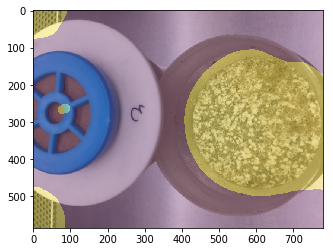

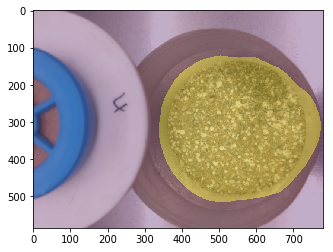

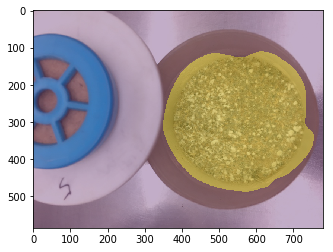

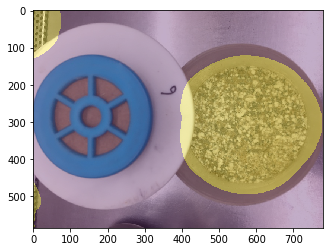

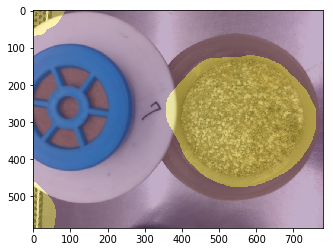

...

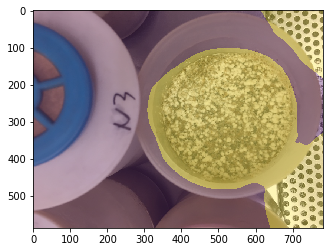

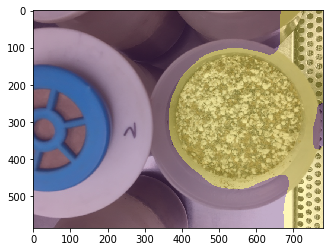

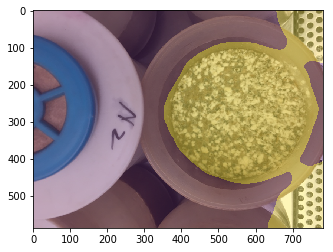

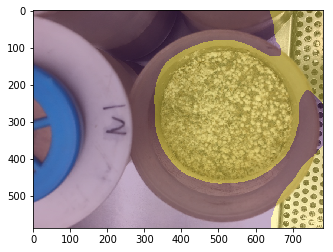

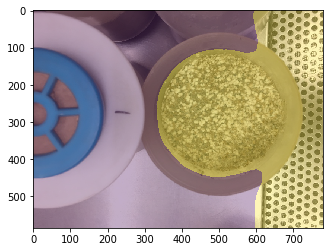

In [3]:
pdpath = os.listdir(rootpath)
img_df = pd.DataFrame([], columns=['image_array', 'img_path', 'image_name'])

num = 0

for i, pdname in enumerate(pdpath):
    img_name = fnmatch.filter(os.listdir(os.path.join(rootpath, pdname)), '*.jpg')
    
    num = num + len(img_name)
    for j, fname in enumerate(img_name):
        filename = rootpath + pdname + '/' + fname
        img, roi = define_roi(filename)
        
        plt.figure()
        plt.imshow(roi, alpha=0.8)
        plt.imshow(img, alpha=0.6)
# print('All valid image file numeber :', num)

/opt/conda/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


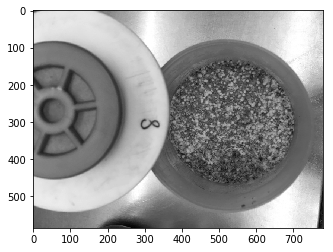

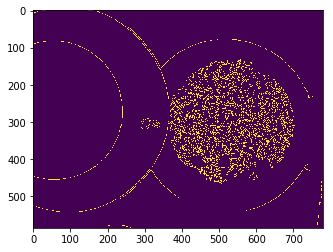

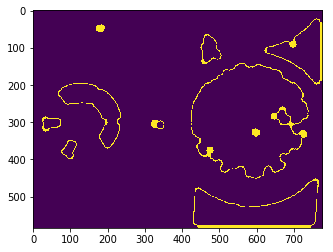

In [31]:
file = rootpath + 'T8-170705/image006.jpg' 

from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.segmentation import clear_border, slic
from skimage.morphology import disk, closing
from skimage.filters import rank, sobel, threshold_local

# to grayscale
img = plt.imread(file)
img_g = rgb2gray(img)
plt.figure()
plt.imshow(img_g, cmap='gray')

# find edges
edges = canny(img_g, sigma=1.0,
              low_threshold=0.1, 
              high_threshold=0.5)

from skimage.filters import threshold_otsu
thres_img = threshold_otsu(edges)
thres_img1 = edges > thres_img
plt.figure()
plt.imshow(thres_img1)

# find rois
mark = sobel(test)
mask = np.zeros_like(mark)
mask[mark <= 0] = 0
mask[mark > 0] = 1

thres_img2 = threshold_local(c_rois, block_size=3, method='gaussian', offset=0, mode='nearest', param=3)
thres_img2[thres_img2 >= 1] = 1
thres_img2[thres_img2 < 1] = 0

# mean filter
roi = rank.mean_bilateral(thres_img2, selem=disk(81), s0=256, s1=256)
mean_filter = np.mean(roi)
roi[roi <= mean_filter] = 0
roi[roi > mean_filter] = 1

# from skimage.segmentation import find_boundaries
# roi_label = find_boundaries(roi, mode='inner')
plt.figure()
plt.imshow(c_rois)

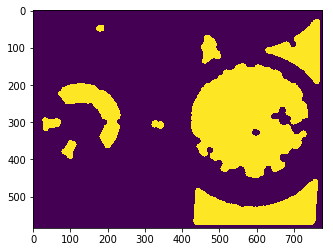

In [28]:
file = rootpath + 'T8-170804/image002.jpg'
# file = rootpath + 'T8-170830/image002.jpg'


from skimage import color, filters, measure
from skimage import img_as_ubyte, morphology
from skimage import draw
from sklearn.cluster import MeanShift
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.segmentation import clear_border, slic
from skimage.morphology import disk, closing, opening
from skimage.filters import rank, sobel, threshold_local
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.draw import circle_perimeter
from scipy.ndimage import gaussian_filter
from skimage.morphology import reconstruction


# to grayscale
img = plt.imread(file)
img_g = rgb2gray(img)

# find edges
edges = canny(img_g, sigma=1.0,
              low_threshold=0.1, 
              high_threshold=0.5)

from skimage.filters import threshold_otsu
thres_img = threshold_otsu(edges)
thres_img1 = edges > thres_img

from scipy import ndimage
fill_holes = ndimage.binary_fill_holes(thres_img1)
closing_img = morphology.binary_closing(fill_holes, selem=disk(8))
opening_img = opening(closing_img, selem=disk(8))


plt.figure()
plt.imshow(opening_img)


# # find rois
# mark = sobel(test)
# mask = np.zeros_like(mark)
# mask[mark <= 0] = 0
# mask[mark > 0] = 1
# c_rois = closing(mask, disk(8))

# test = threshold_local(c_rois, block_size=3, method='gaussian', offset=0, mode='nearest', param=3)
# test[test >= 1] = 1
# test[test < 1] = 0

# # mean filter
# roi = rank.mean_bilateral(test, selem=disk(81), s0=256, s1=256)
# mean_filter = np.mean(roi)
# roi[roi <= mean_filter] = 0
# roi[roi > mean_filter] = 1

# from skimage.segmentation import find_boundaries
# roi_label = find_boundaries(roi, mode='inner')
# plt.figure()
# plt.imshow(roi_label)

ValueError: shape mismatch: value array of shape (3,) could not be broadcast to indexing result of shape (1424,)

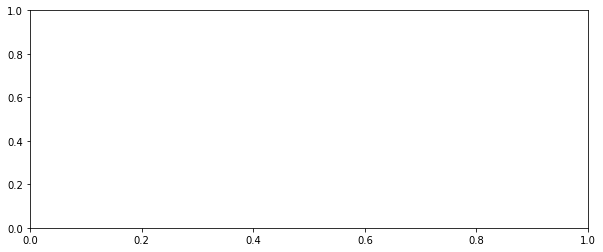

In [11]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))
# image = color.gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius)
    test[circy, circx] = (220, 20, 20)

ax.imshow(test, cmap=plt.cm.gray)
plt.show()

In [ ]:
file = rootpath + 'T8-170705/image006.jpg' 

from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.segmentation import clear_border, slic
from skimage.morphology import disk, closing
from skimage.filters import rank, sobel, threshold_local

# to grayscale
img = plt.imread(file)
img_g = rgb2gray(img)
plt.figure()
plt.imshow(img_g, cmap='gray')

# find edges
edges = canny(img_g, sigma=1.0,
              low_threshold=0.1, 
              high_threshold=0.5)

from skimage.filters import threshold_otsu
thres_img = threshold_otsu(edges)
thres_img1 = edges > thres_img
plt.figure()
plt.imshow(thres_img1)

from skimage.filters import gaussian


# from skimage.segmentation import find_boundaries
# roi_label = find_boundaries(roi, mode='inner')
plt.figure()
plt.imshow(c_rois)